# Mask RCNN Road Feature Extraction using Deep learning

* 🔬 Data Science | Artificial Intelligence
* 🥠 Deep Learning and Object/Instance Segmentation
* Kevin Muhia Gathogo

## Table of Contents
* [Introduction](#Introduction)
* [Export training data for deep learning](#Export-training-data-for-deep-learning)
* [Model training](#Model-training)
 * [Necessary Imports](#Necessary-Imports)
 * [Visualize training data](#Visualize-training-data)
 * [Load model architecture](#Load-model-architecture)
 * [Train the model](#Train-the-model)
 * [Visualize detected Roads Features](#Visualize-detected-building-footprints)
 * [Save model](#Save-model)
* [Model inference](#Model-inference)

* [Hyperparameter Tuning and Approach By Road Class](#Hyperparameter-Tuning-and-Approach-By-Road-Class)

There are several ways of extracting road assets.
These include manual digitization by using tools to draw outline of each asset or converting CAD as-builts to GIS features.
However, it is a labor intensive and time consuming process. 

In this workflow, we will basically have three steps.

- Export Training Data
- Train a Model
- Deploy Model and Extract the class of interest

## Export training data for deep learning

This will create all the necessary files needed for the next step in the specified 'Output Folder'. These files serve as our training data.

## Model training

### Necessary Imports

In [129]:
import os
from pathlib import Path
from arcgis.learn import MaskRCNN, prepare_data

In [130]:
print(dir(MaskRCNN))

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_arcgis_init_callback', '_available_metrics', '_check_backbone_support', '_check_data_support_with_pretrained_path', '_check_dataset_support', '_check_requisites', '_check_tf', '_create_emd_template', '_create_html', '_create_tfonnx_emd_template', '_find_lr', '_freeze', '_get_batched_predictions', '_get_emd_params', '_get_post_processed_model', '_get_tfonnx_emd_params', '_get_transformed_image', '_init_tensorflow', '_model_metrics', '_pixel_mask_image', '_predict_batch', '_predict_postprocess', '_predict_results', '_publish_dlpk', '_save', '_save_as_tfonnx', '_save_model_characteristics', '_save_pytorch_tflite', '_save_pytorch_torchscript', '_sav

In [131]:
#print(help(prepare_data))

`prepare_data` function takes path to training data and creates a fastai databunch with specified transformation, batch size, split percentage, etc.

In [132]:
data_path = Path(r'E:\Drive\INNERSPACE\GIS_Data_scientist\GIS_Data_Scientist\mask_rcnn_training_08_02_2024\image_chips')

In [133]:
data = prepare_data(path=data_path,
                    chip_size=256,
                    transform=True,
                    val_split_pct=0.2,
                    batch_size=10,
                   )


Please check your dataset. 6 images dont have the corresponding label files.


### Visualize training data

`show_batch()` method randomly pick a few training chips and visualize them. The chips are overlaid with masks representing the road features in each image chip.

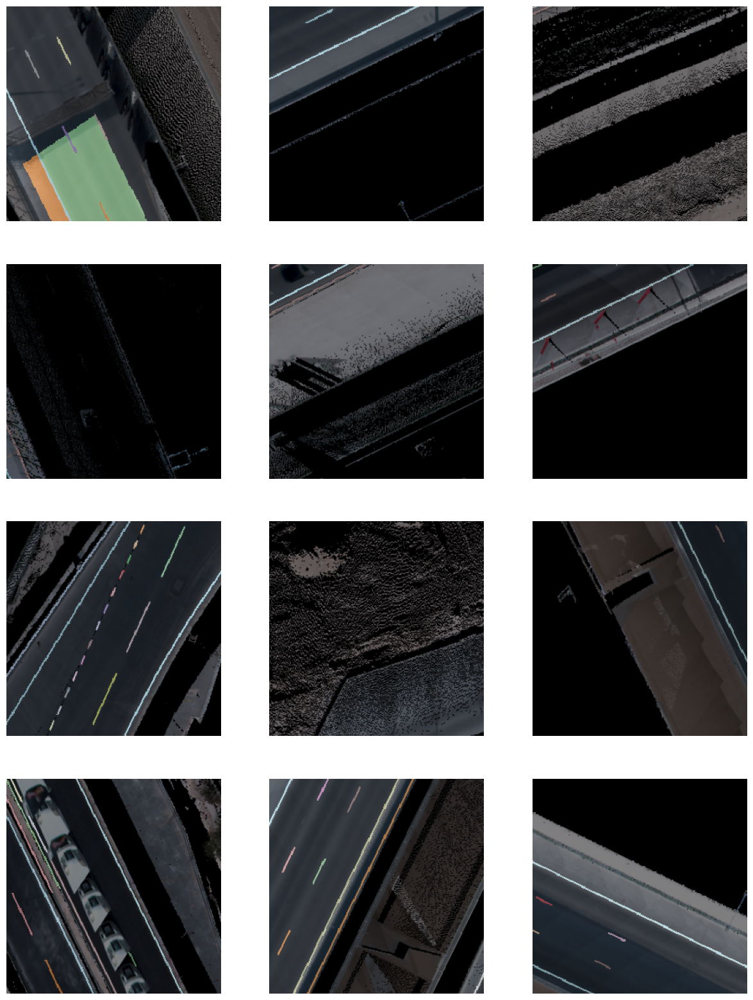

In [134]:
data.show_batch(rows=4)

### Load model architecture

In [135]:
model = MaskRCNN(data)

Learning rate is one of the most important hyperparameters in model training. We will use the `lr_find()` method to find an optimum learning rate at which we can train a robust model.

In [136]:
#MaskRCNN Object
#property

#List of available metrics that are displayed in the training table. 
model.available_metrics

['valid_loss', 'average_precision']

In [137]:
#static
#Supported list of backbones for this model.

#model.backbones()

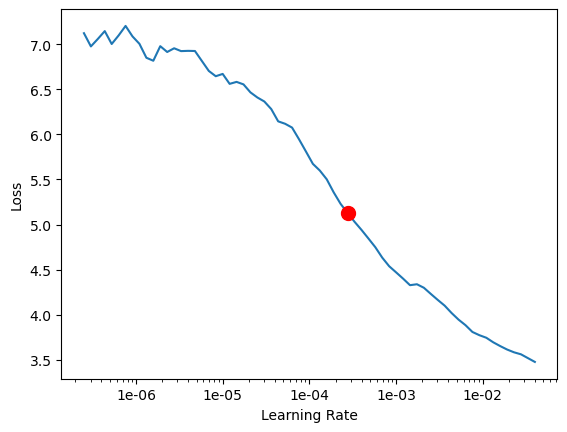

0.0002754228703338166

In [138]:
#Runs the Learning Rate Finder. Helps in choosing the optimum learning rate for training the model.

lr = model.lr_find(allow_plot=True)
lr

### Train the model

Monitor training on Tensorboard using the following command: 'tensorboard --host=ESD-KEGATHOGO --logdir="E:\Drive\INNERSPACE\GIS_Data_scientist\GIS_Data_Scientist\mask_rcnn_training_08_02_2024\image_chips\training_log"'
epoch     train_loss  valid_loss  average_precision  time    
0         1.192526    1.250330    0.181968           14:20     


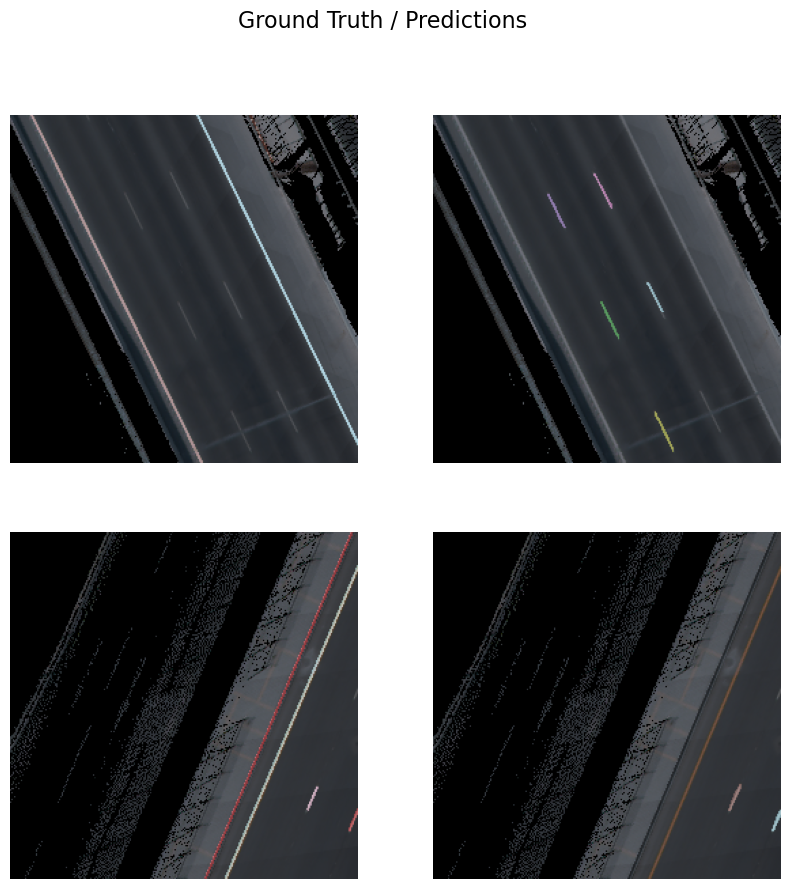

1         1.033137    1.175378    0.270228           14:19     


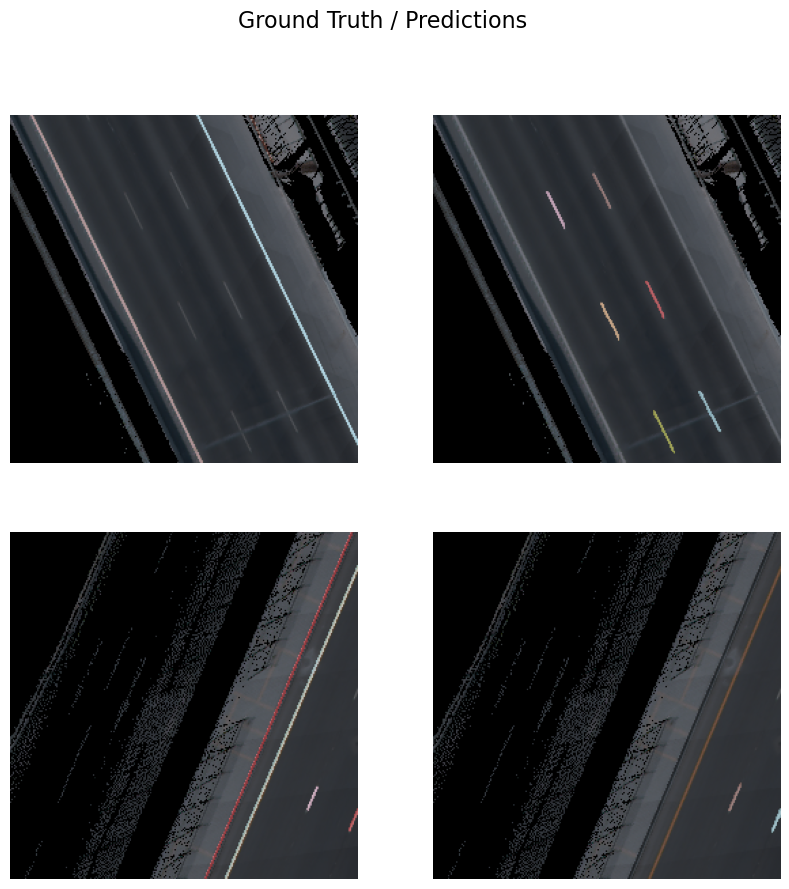

2         0.955549    1.118092    0.282228           13:48     


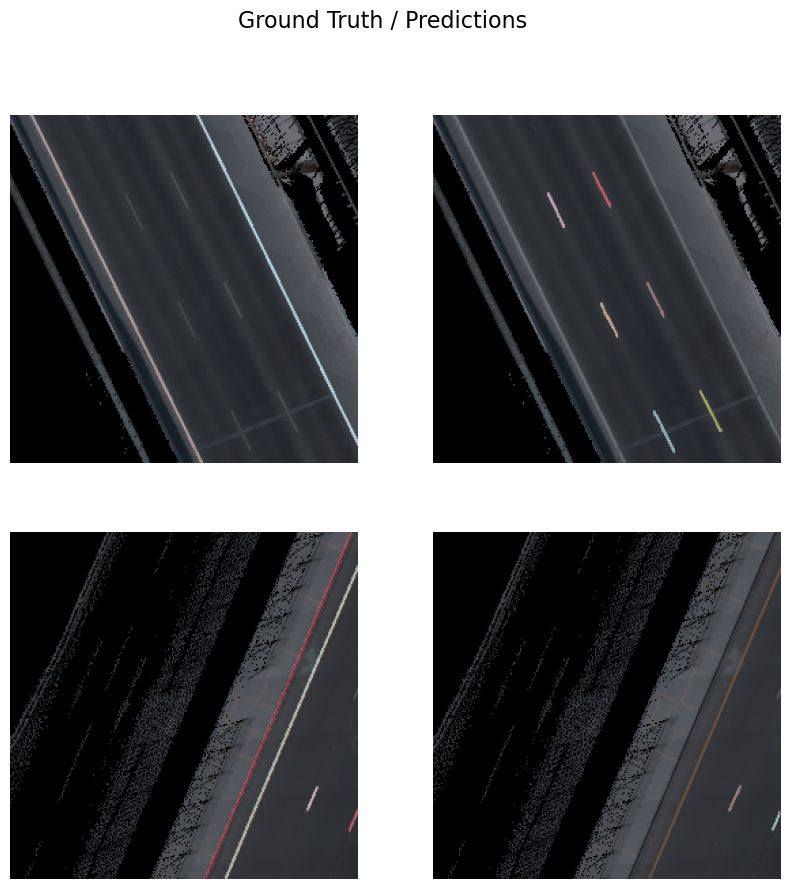

3         0.924995    1.159756    0.320631           14:05     


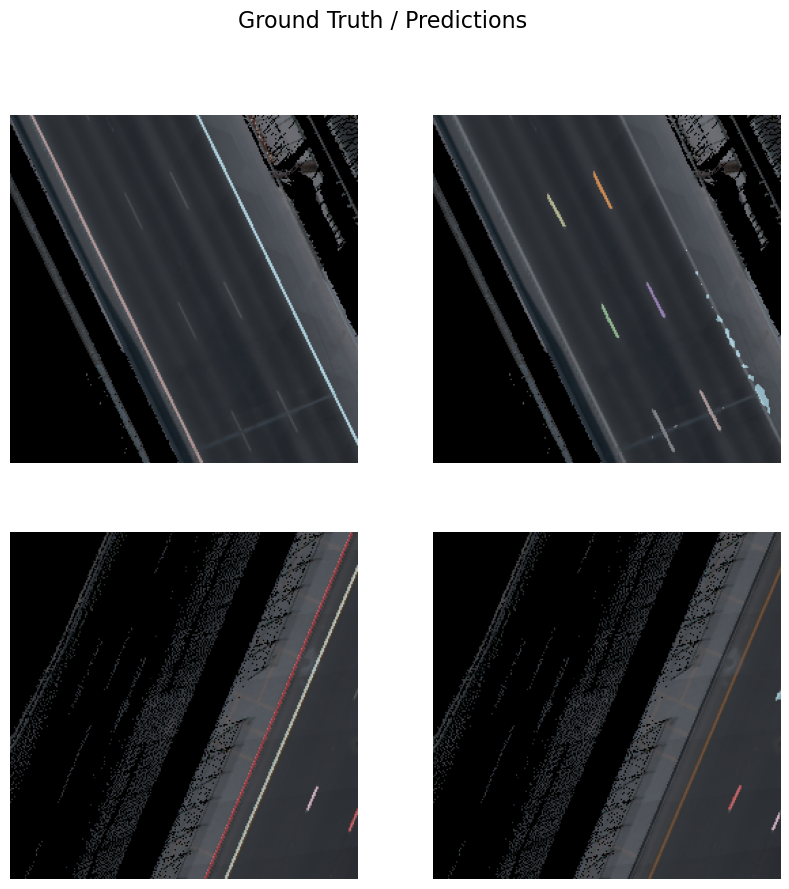

4         0.929706    1.108048    0.289876           14:08     


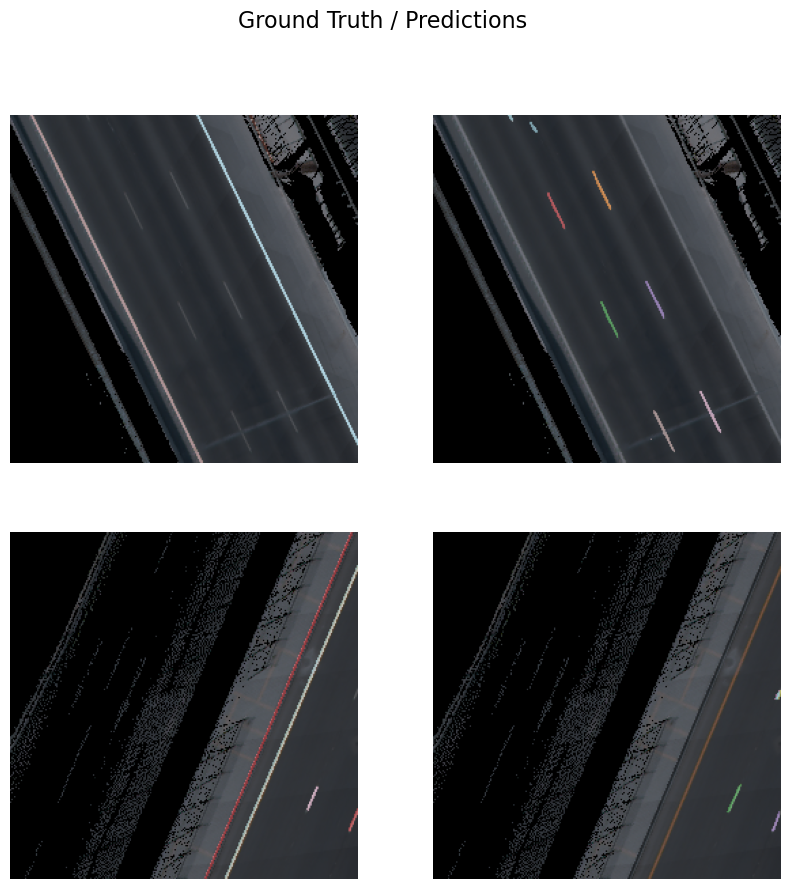

5         0.918750    1.063239    0.301330           13:33     


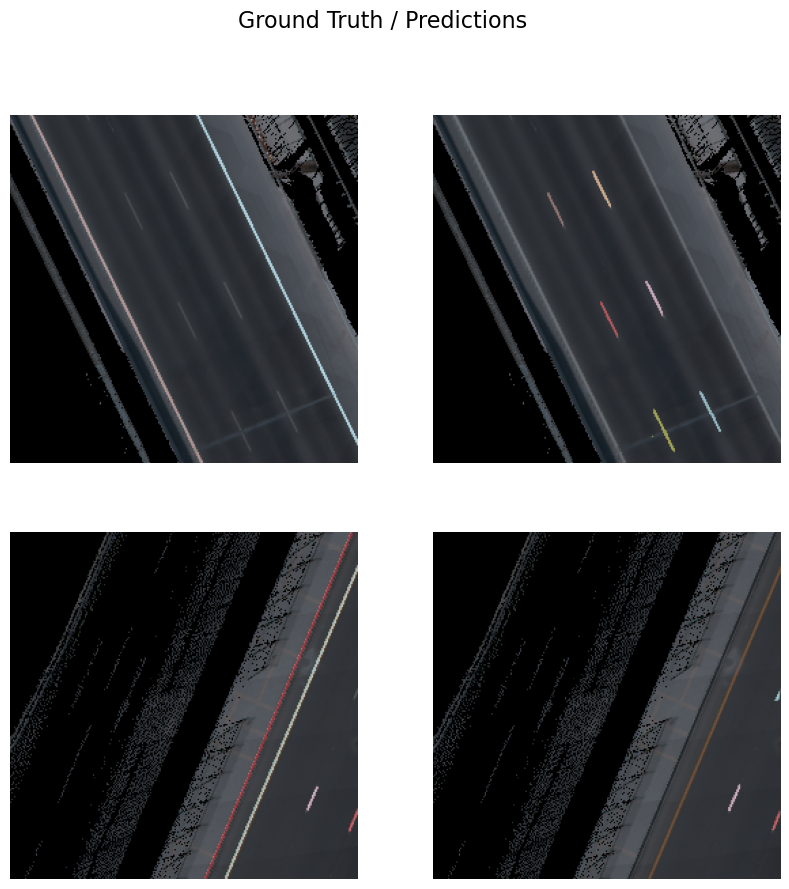

6         0.915181    1.111945    0.327326           13:52     


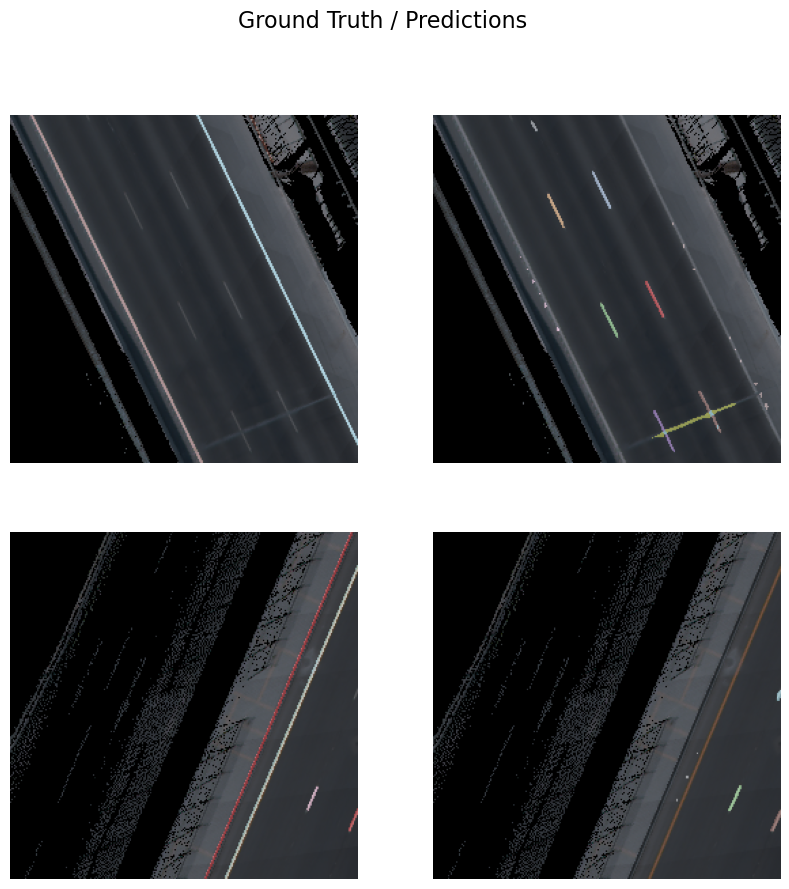

7         0.904240    1.044742    0.325589           13:54     


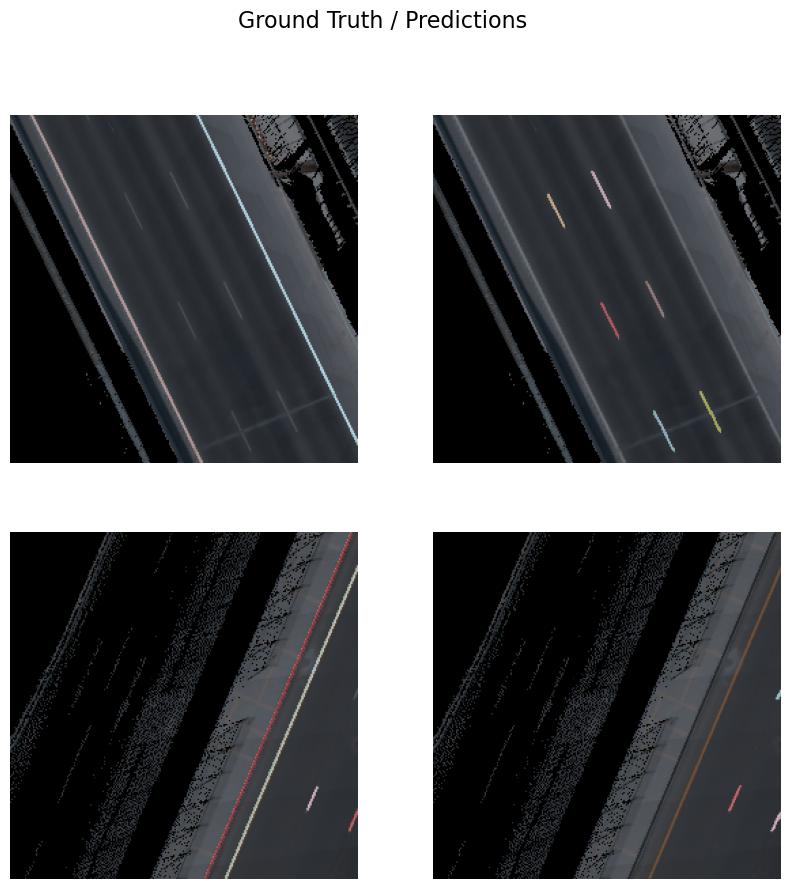

8         0.874971    1.032483    0.326525           13:31     


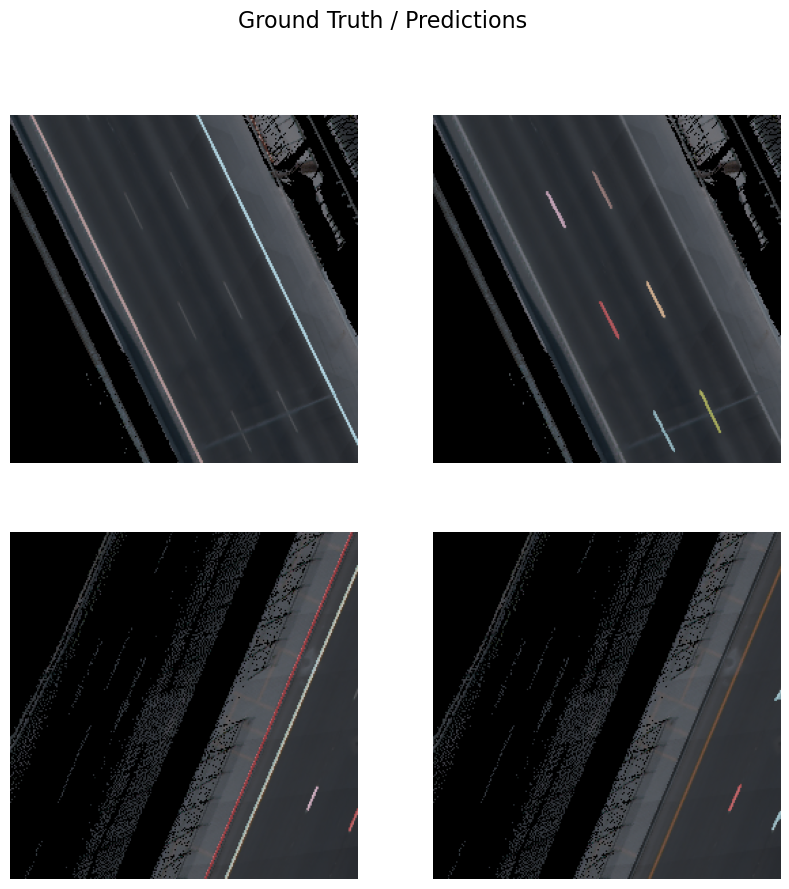

9         0.833257    1.041319    0.342388           13:49     


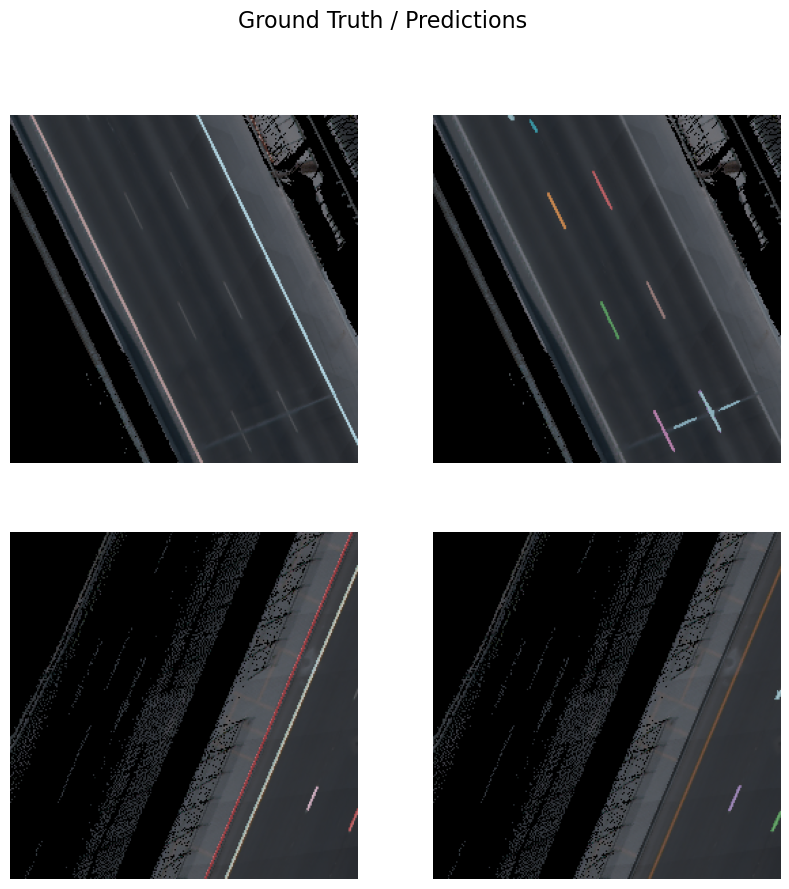

10        0.852230    1.007035    0.323025           13:33     


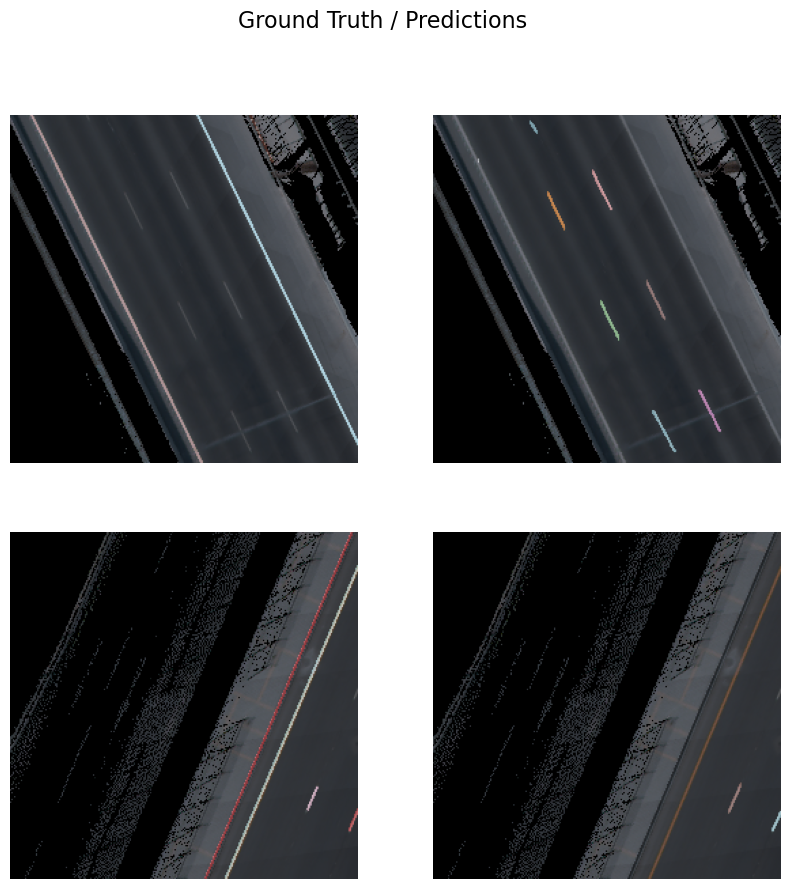

11        0.777478    1.050334    0.341536           13:25     


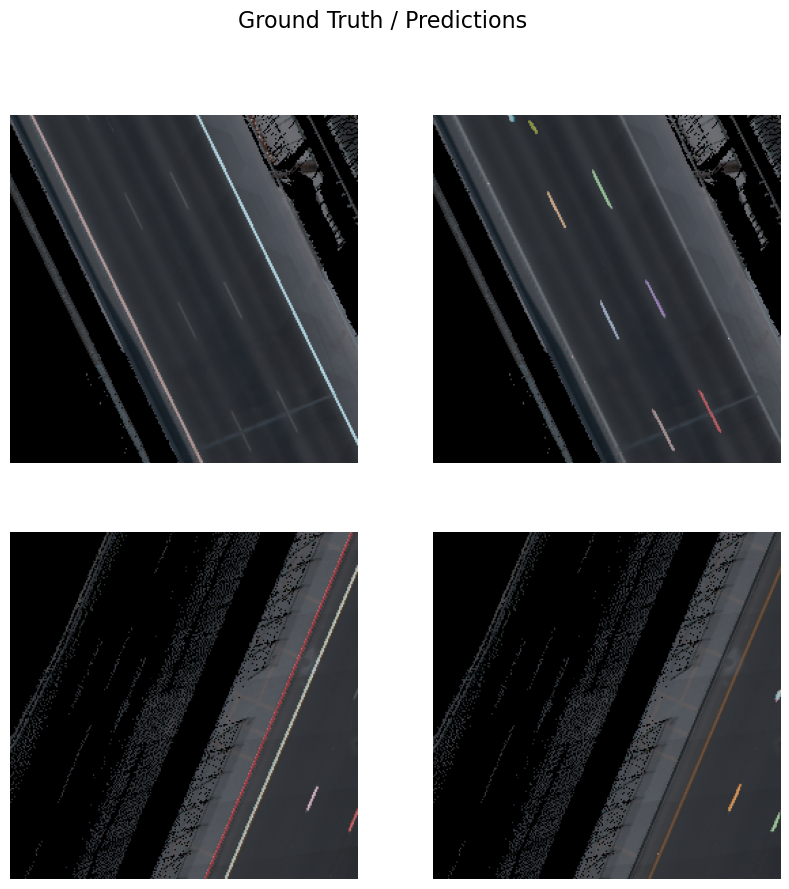

12        0.810318    1.005198    0.344398           13:34     


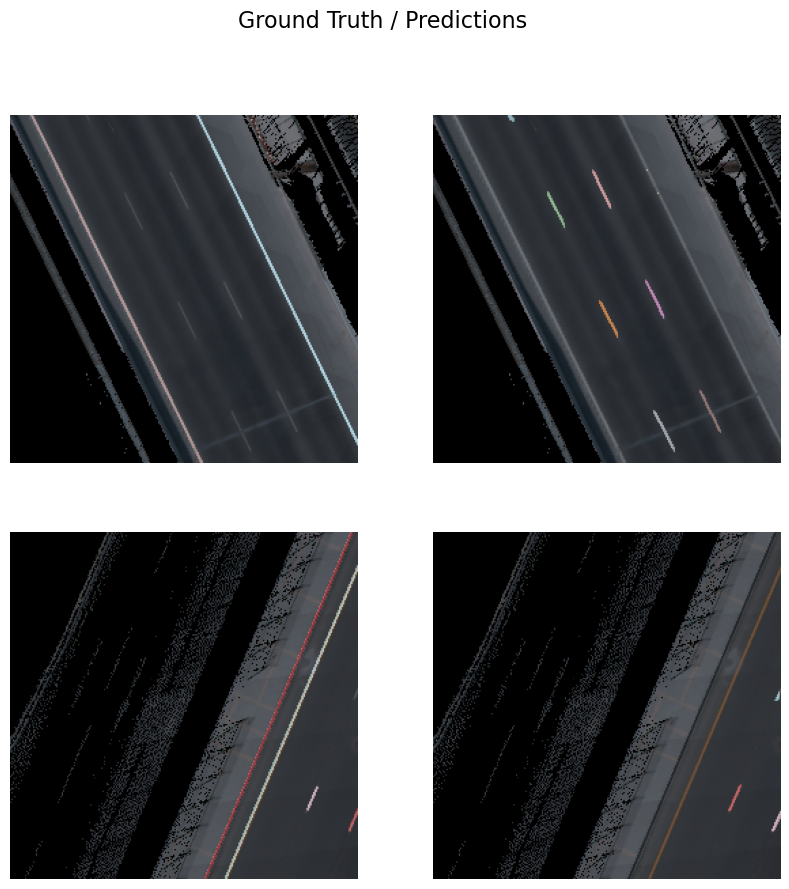

13        0.785496    1.013869    0.349359           13:46     


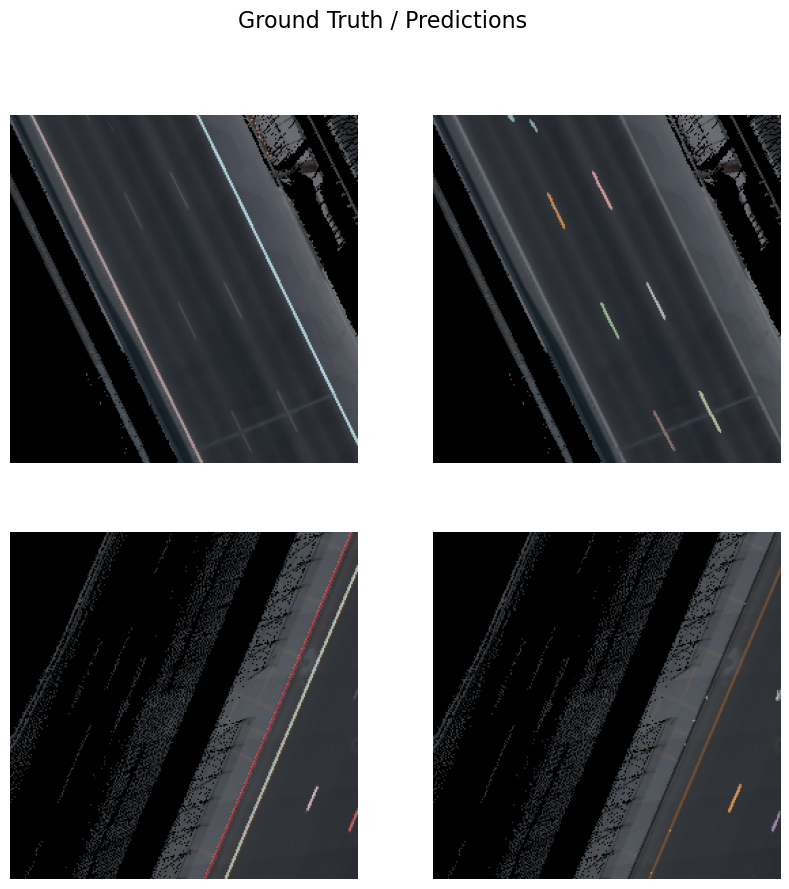

14        0.819214    1.002574    0.360772           13:33     


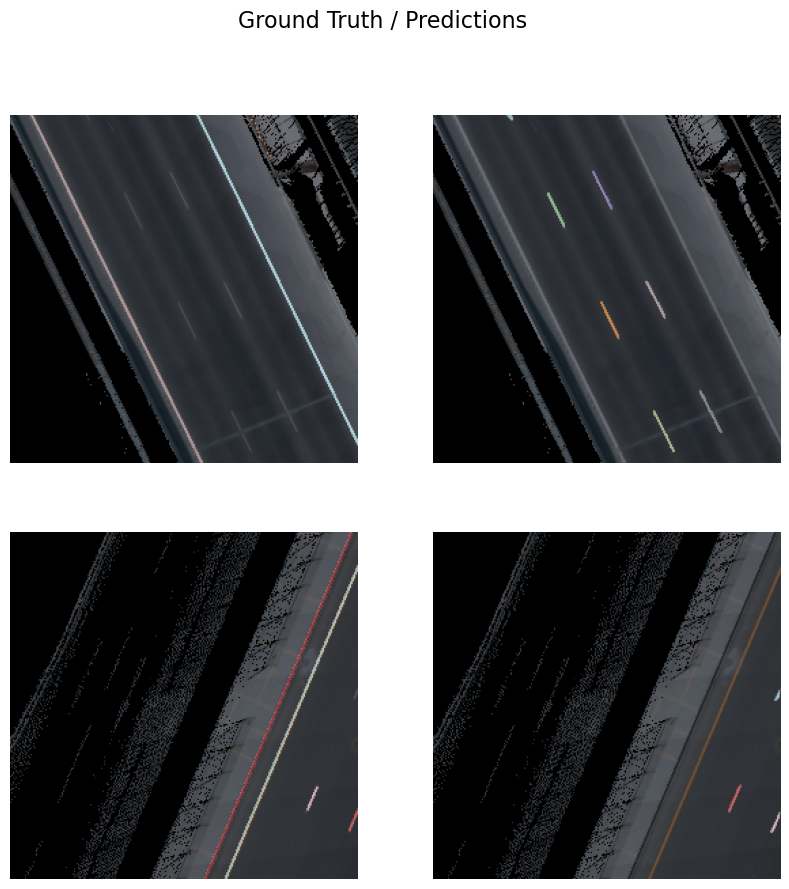

15        0.779359    1.031703    0.358235           13:43     


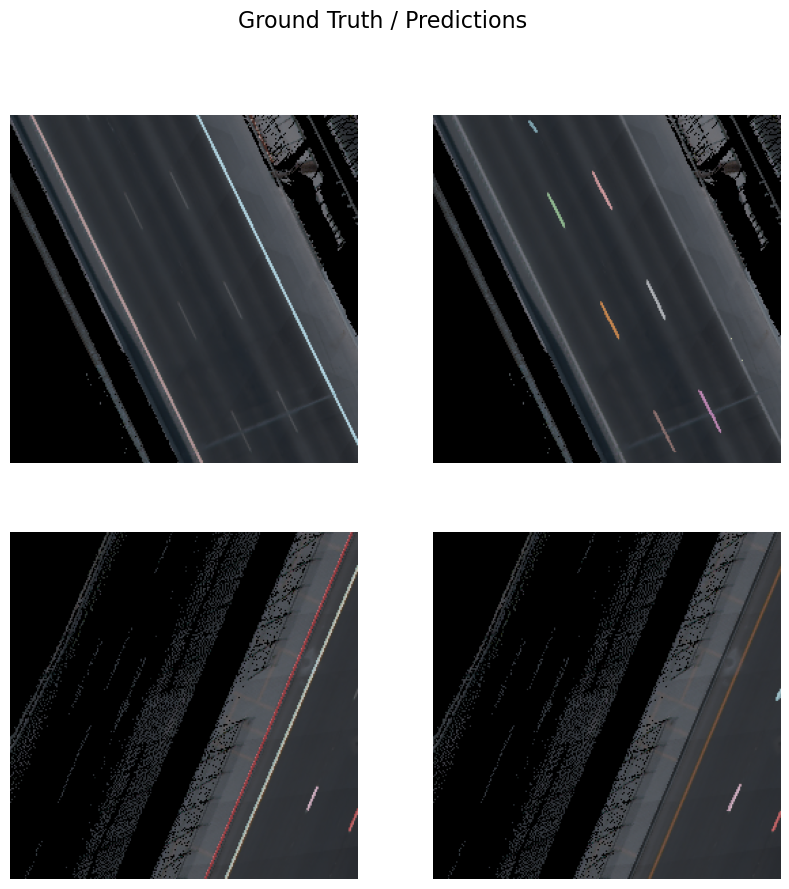

16        0.772701    0.975746    0.341695           13:39     


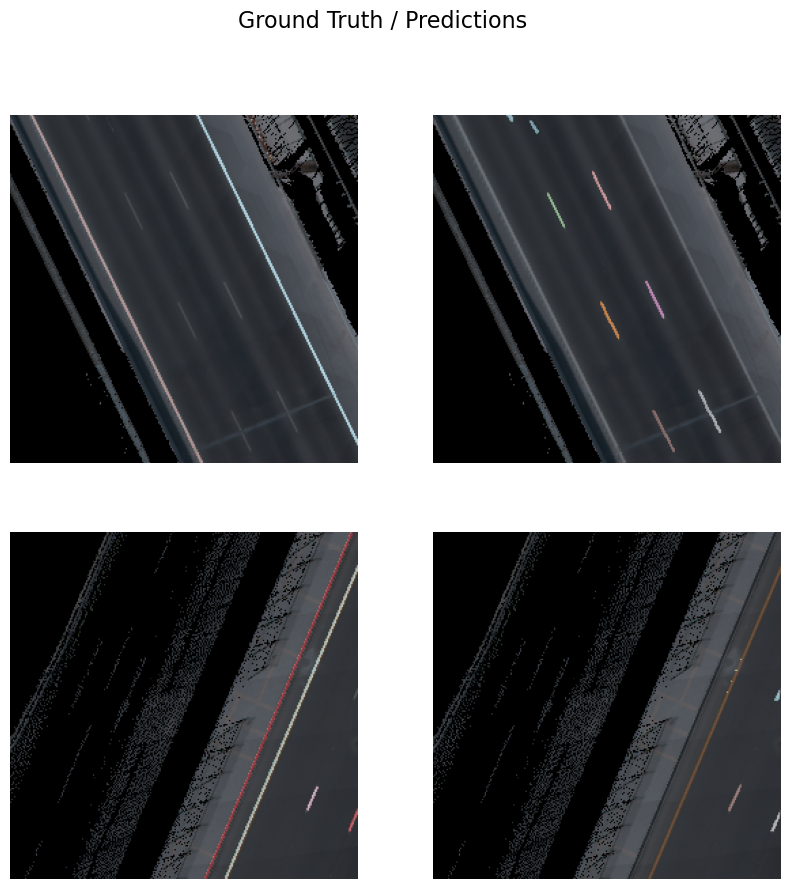

17        0.809948    1.039676    0.367198           13:41     


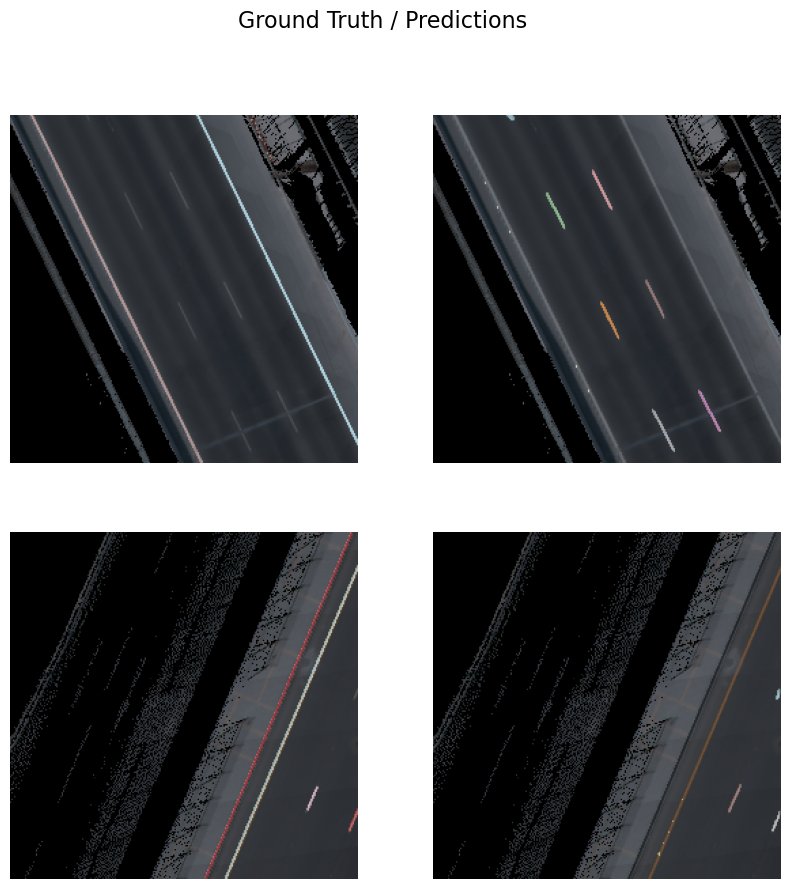

18        0.769032    1.002869    0.369316           13:33     


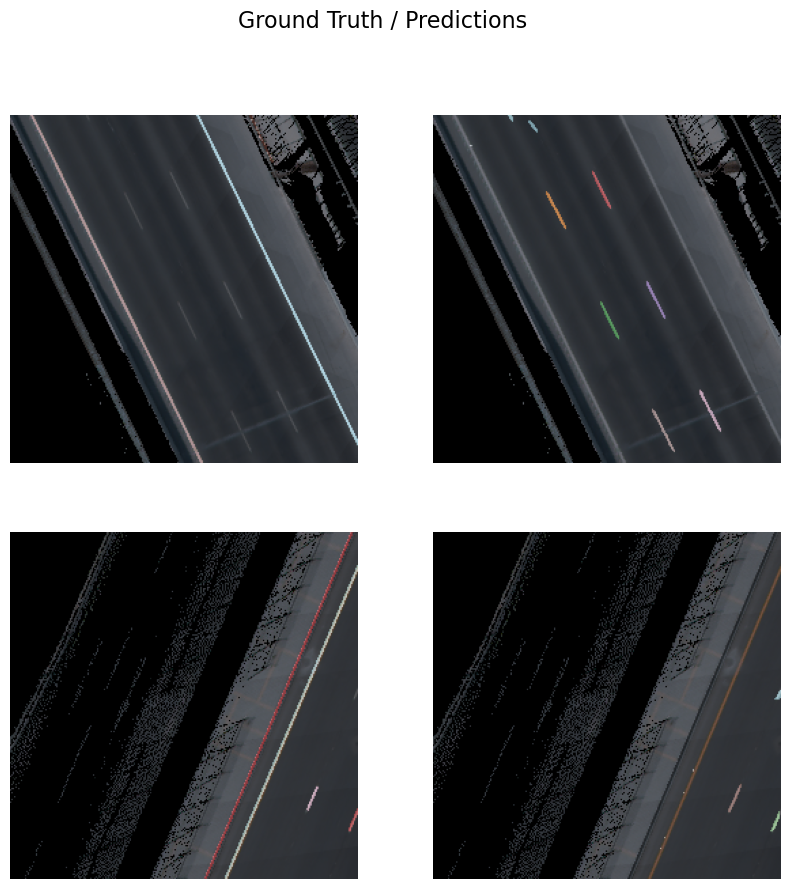

19        0.732000    0.981301    0.363593           13:34     


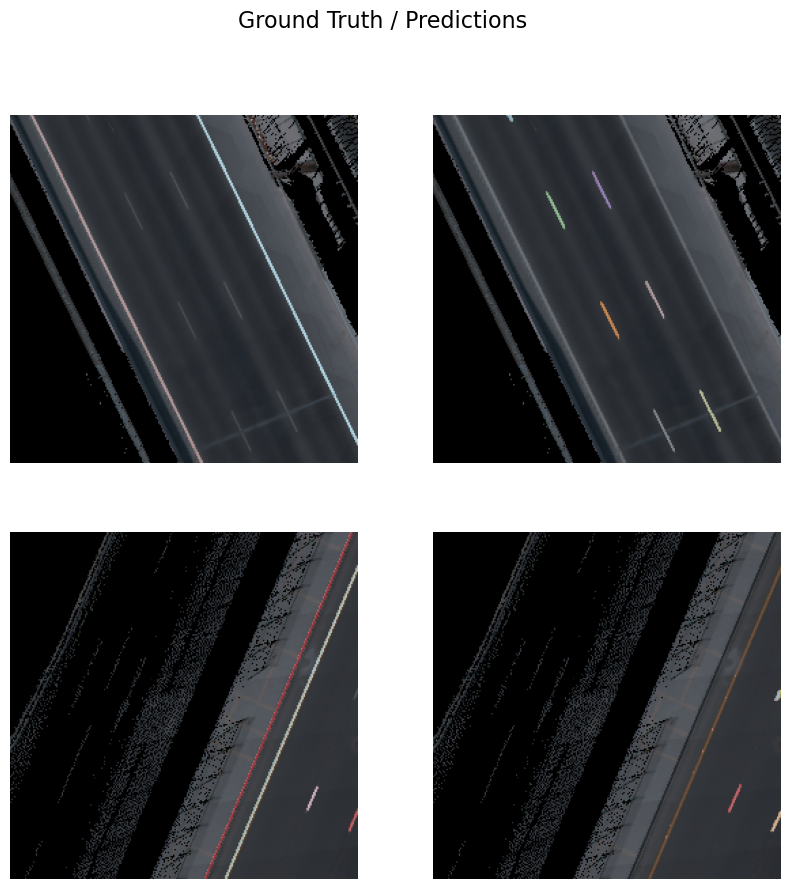

20        0.750985    0.964277    0.377291           13:16     


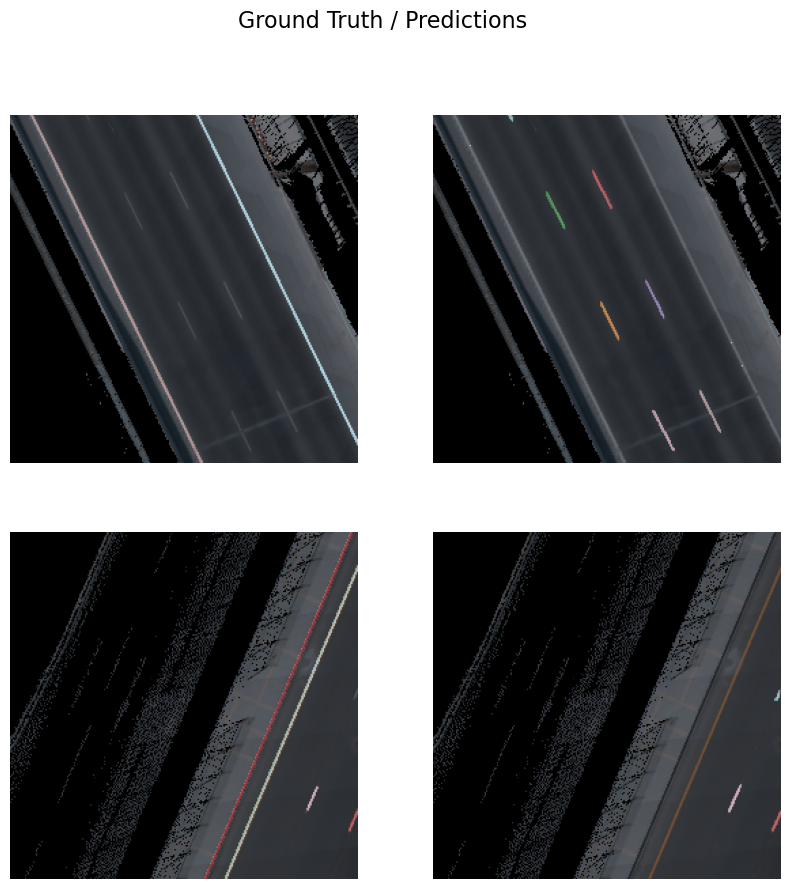

21        0.719540    0.978047    0.365365           13:29     


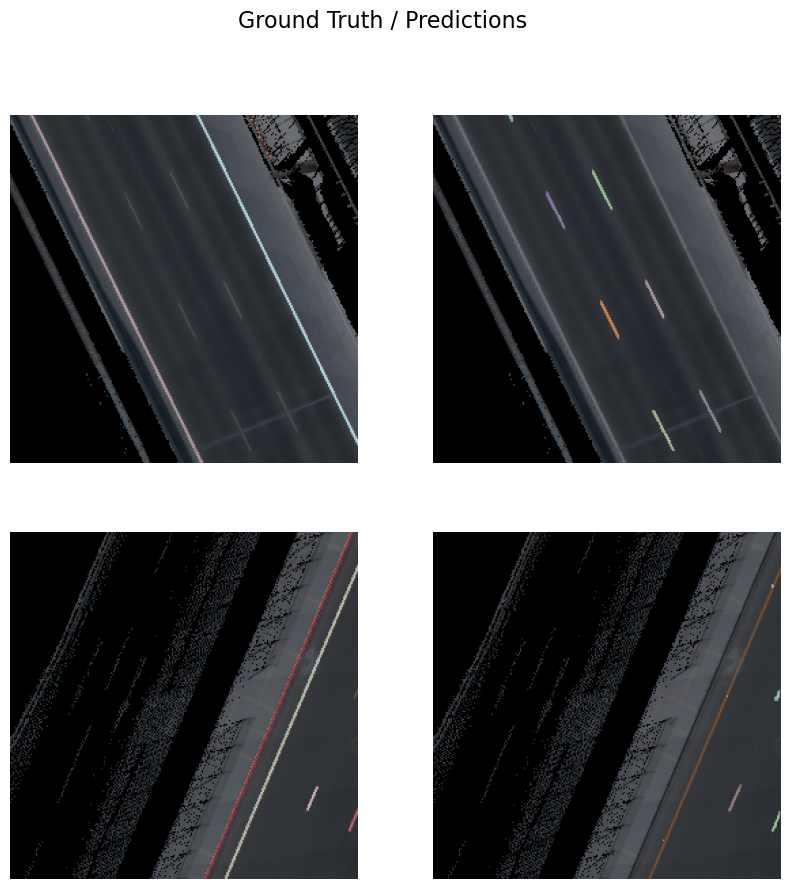

22        0.717857    0.973409    0.368409           13:45     


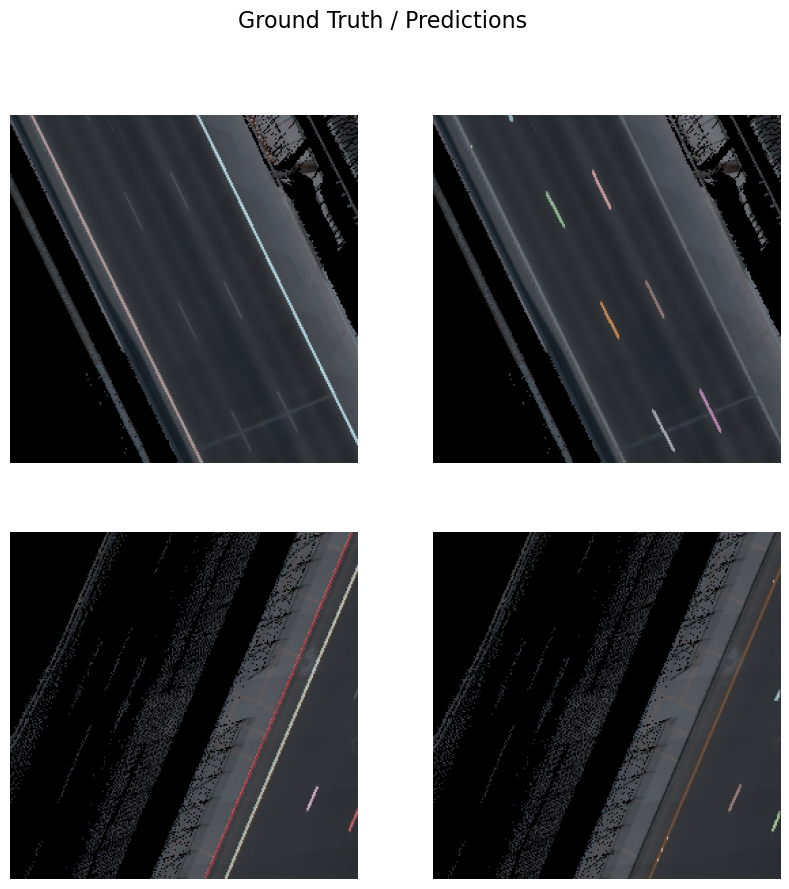

23        0.772777    0.977116    0.374034           13:27     


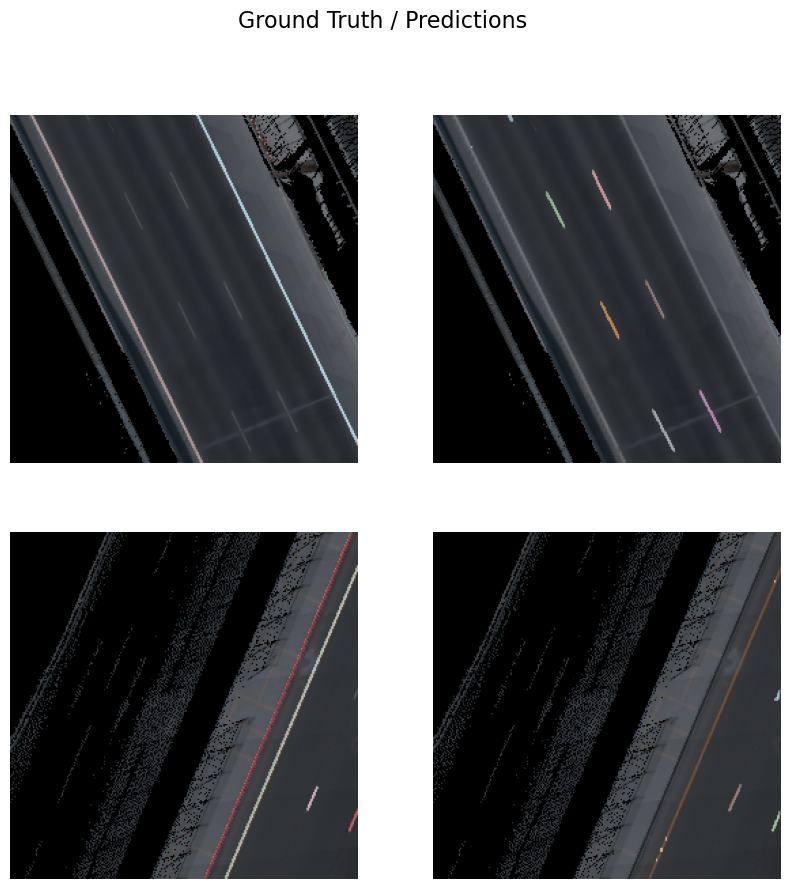

24        0.744741    0.976987    0.374860           13:47     


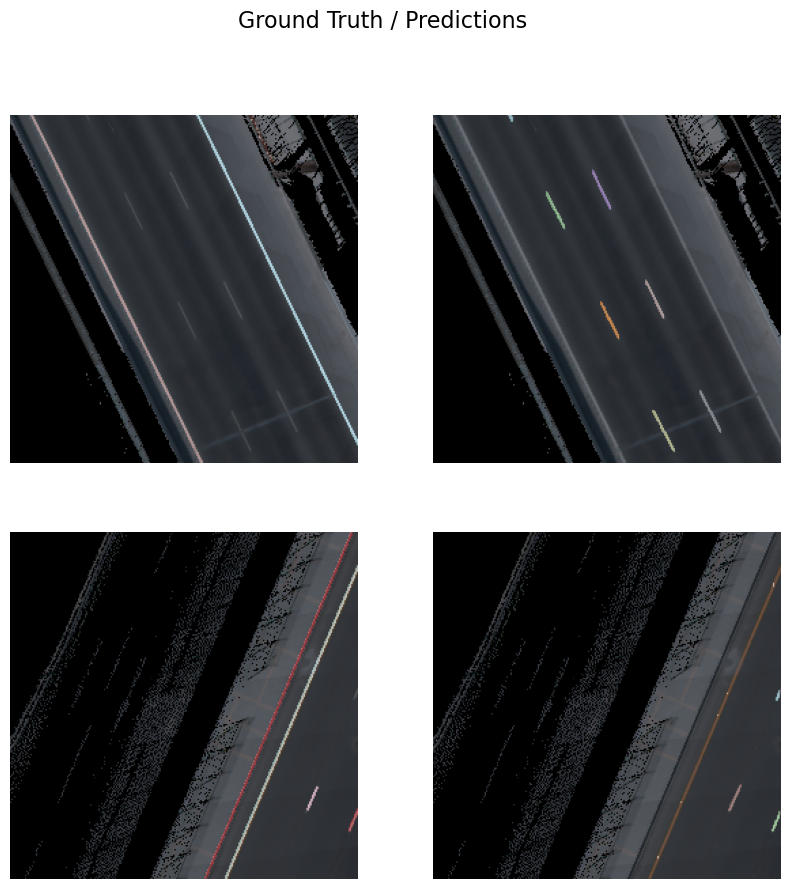

In [140]:
#Training the model for the specified number of epochs and using the specified learning rates

model.fit(epochs=25,
          lr=lr,
          one_cycle=True,
          early_stopping=False,
          checkpoint=True,
          tensorboard=True,
          monitor='average_precision'
         )


We are using the suggested learning rate above to train the model for 25 epochs.

In [ ]:
#model.fit(25,lr=lr)

## Visualize detected road features

The `model.show_results()` method can be used to display the detected road features. Each detection is visualized as a mask by default.

In [ ]:
#model.show_results()

We can set the mode parameter to  `bbox_mask` for visualizing both mask and bounding boxes.

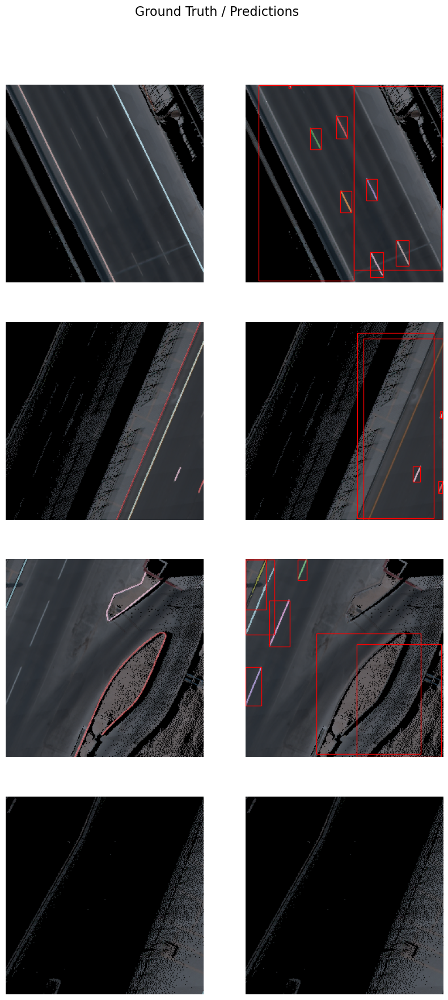

In [141]:
model.show_results(mode='bbox_mask')

In [ ]:
model.show_results(rows=4,
                   mode='mask',
                   mask_threshold=0.5,
                   box_threshold=0.7,
                   tta_prediction=False,
                   imsize=5,
                   index=0,
                   alpha=0.5,
                   cmap='tab20'
                  )

### Save model

As we can see, with 10 epochs, we are already seeing reasonable results. Further improvments can be achieved through more sophisticated hyperparameter tuning. Let's save the model, so it can be used for inference, or further training subsequently. By default, it will be saved into your data_path that you specified in the very beginning of this notebook, in the `prepare_data` call.

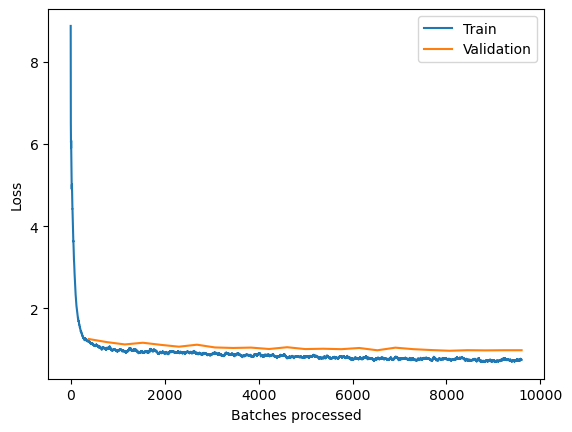

In [142]:
#Plot validation and training losses after fitting the model.

model.plot_losses()

In [143]:
#model.save('MASKRCNN100epochs',compute_metrics)

In [144]:
model.save('MASKRCNN100epochs', framework='PyTorch', 
           publish=False, gis=None, compute_metrics=True, 
           save_optimizer=False, save_inference_file=True)

Computing model metrics...


WindowsPath('E:/Drive/INNERSPACE/GIS_Data_scientist/GIS_Data_Scientist/mask_rcnn_training_08_02_2024/image_chips/models/MASKRCNN100epochs')

In [13]:
%tensorboard --logdir logs/E:\Drive\INNERSPACE\Anaconda_AI_ML\OCOM5300M_AIProject\FEATURE_EXTRACTION\LiDAR_DATA\B_Lidar_Rasterized_Image\Object-Based\MaskRCNN\training\training_log

Launching TensorBoard...
Please visit http://localhost:6006 in a web browser.


## Model inference

The saved model is used to extract road features masks using the 'Detect Objects Using Deep Learning' tool available in ArcGIS Pro

# B. HYPERPARAMETER Tuning - Extraction Class Road Markings

Based on the first run of training, For robustness and computational efficiency. In this new workflow, each class will be trained independely and data augmentation a process that increase the training data will be employed

![image.png](attachment:image.png) & ![image-2.png](attachment:image-2.png)